# Installing necessary packages

In [1]:
!pip install git+https://github.com/mvlier/topapprox@main
!pip install -U -q cripser persim plotly kaleido

  Cloning https://github.com/mvlier/topapprox (to revision main) to /tmp/pip-req-build-b_ltl6xv
  Running command git clone --filter=blob:none --quiet https://github.com/mvlier/topapprox /tmp/pip-req-build-b_ltl6xv
  Resolved https://github.com/mvlier/topapprox to commit d4bdac1e80a33254927c71c96859de4563e78a2a
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for topapprox: filename=topapprox-0.0.2-py3-none-any.whl size=9397 sha256=cf8350dd73e1ef7da2dfa1c892a0f8770f4b94942135c7a95ffc119e8555bbc2
  Stored in directory: /tmp/pip-ephem-wheel-cache-sy4ssjvn/wheels/49/17/71/71c98f055e9b71cd32cab64370e89376d750f95bf7f991d9c2
Successfully built topapprox
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 3.0 MB/s eta 0:00:00


In [1]:
import topapprox as ta
import cripser
import persim
import numpy as np
import matplotlib.pyplot as plt
import urllib.request
import sys,os

import warnings
warnings.filterwarnings("ignore")

# Size Aware Low Persistence Filter

In [2]:
def plot_diagrams(
    diagrams,
    plot_only=None,
    title=None,
    xy_range=None,
    labels=None,
    colormap="default",
    cmap="viridis",
    size=20,
    marker="o",
    ax_color=np.array([0.0, 0.0, 0.0]),
    diagonal=True,
    lifetime=False,
    legend=True,
    show=False,
    grid=False,
    return_ax=False,
    color_by_value=False,
    ax=None,
    label_color_bar="Value",
    vmin=None,
    vmax=None
):
    import matplotlib.pyplot as plt
    import numpy as np

    ax = ax or plt.gca()
    plt.style.use(colormap)

    xlabel, ylabel = "Birth", "Death"

    if not isinstance(diagrams, list):
        diagrams = [diagrams]

    if labels is None:
        labels = [f"$H_{{{i}}}$" for i, _ in enumerate(diagrams)]

    if plot_only:
        diagrams = [diagrams[i] for i in plot_only]
        labels = [labels[i] for i in plot_only]

    if not isinstance(labels, list):
        labels = [labels] * len(diagrams)

    diagrams = [dgm.astype(np.float32, copy=True) for dgm in diagrams]

    # Use only the first two columns for xy_range computation
    bounds_dgms = [dgm[:, :2] for dgm in diagrams]
    concat_dgms = np.concatenate(bounds_dgms).flatten()
    has_inf = np.any(np.isinf(concat_dgms))
    finite_dgms = concat_dgms[np.isfinite(concat_dgms)]


    if not xy_range:
        ax_min, ax_max = np.min(finite_dgms), np.max(finite_dgms)
        x_r = ax_max - ax_min
        buffer = 1 if x_r == 0 else x_r / 5
        x_down = ax_min - buffer / 2
        x_up = ax_max + buffer
        y_down, y_up = x_down, x_up
    else:
        x_down, x_up, y_down, y_up = xy_range

    yr = y_up - y_down

    if lifetime:
        diagonal = False
        y_down = -yr * 0.05
        y_up = y_down + yr
        ylabel = "Lifetime"
        for dgm in diagrams:
            dgm[:, 1] -= dgm[:, 0]
        ax.plot([x_down, x_up], [0, 0], c=ax_color)

    if diagonal:
        ax.plot([x_down, x_up], [x_down, x_up], "--", c=ax_color)

    if has_inf:
        b_inf = y_down + yr * 0.95
        ax.plot([x_down, x_up], [b_inf, b_inf], "--", c="k", label=r"$\infty$")
        for dgm in diagrams:
            dgm[np.isinf(dgm)] = b_inf

    # Plot each diagram
    for dgm, label in zip(diagrams, labels):
        if color_by_value and dgm.shape[1] >= 3:
            x, y, c_vals = dgm[:, 0], dgm[:, 1], dgm[:, 2]
            sc = ax.scatter(x, y, c=c_vals, cmap=cmap, s=size, marker=marker, edgecolors="black", vmin=vmin, vmax=vmax)
        else:
            x, y = dgm[:, 0], dgm[:, 1]
            sc = ax.scatter(x, y, s=size, label=label, marker=marker, edgecolors="black")

        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)

    ax.set_xlim([x_down, x_up])
    ax.set_ylim([y_down, y_up])
    ax.set_aspect('equal', 'box')

    if grid:
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)

    if title is not None:
        ax.set_title(title)

    if legend and not color_by_value:
        ax.legend(loc="lower right")

    if color_by_value and sc is not None:
        plt.colorbar(sc, ax=ax, label=label_color_bar)

    if show:
        plt.show()

    if return_ax:
        return ax


## Natural image case (Pagoda)

In [3]:
# download image
download_url = "https://raw.githubusercontent.com/mvlier/topapprox/main/tests/data_for_testing/pagoda.npy"
fn = "pagoda.npy"
if not os.path.isfile(fn):
    urllib.request.urlretrieve(download_url, fn)

surface = np.load(fn)

In [4]:
surface.shape

(534, 800)

In [5]:
534*800

427200

In [6]:
tfi = ta.TopologicalFilterImage(surface)
_ = tfi.low_pers_filter(epsilon=0)
PDa = tfi.get_persistence()
PDa = PDa[:,[0,1,4]]

In [7]:
tfi = ta.TopologicalFilterImage(surface, dual=True)
_ = tfi.low_pers_filter(epsilon=0)
PDb = tfi.get_persistence()
PDb = PDb[:,[0,1,4]]

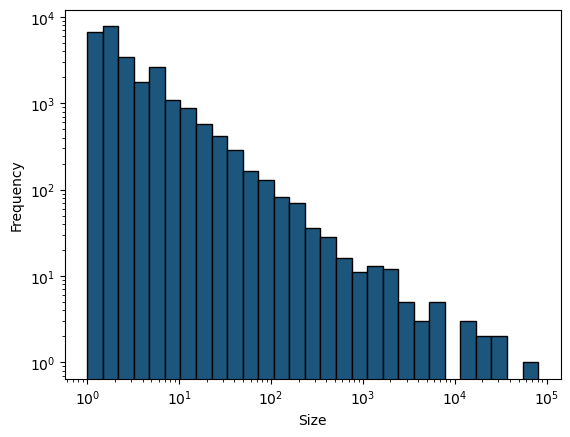

In [8]:
import os
os.makedirs("image", exist_ok=True)


data = PDa[:,2]
MYCOLOR = (29/255, 86/255, 125/255)

# Create logarithmically spaced bins
log_bins = np.logspace(np.log10(data.min()), np.log10(data.max()), num=30)

# Plot histogram with log-scaled bins and x-axis
plt.hist(data, bins=log_bins, color=MYCOLOR, edgecolor='black')
plt.xscale('log')  # Set x-axis to log scale
plt.yscale('log')  # Set y-axis to log scale
# plt.title('Histogram with Log-Scaled X-Axis and Bins')
plt.xlabel('Size')
plt.ylabel('Frequency')
# plt.grid(True, which='both')  # Add grid for both major and minor ticks
plt.savefig('image/persistence_histogram.pdf', bbox_inches='tight')

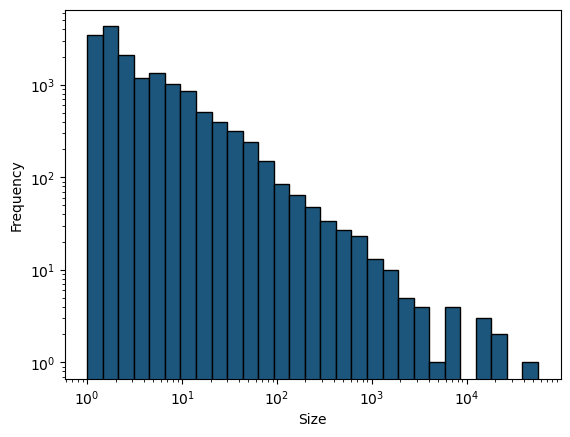

In [9]:


data = PDb[:,2]

# Create logarithmically spaced bins
log_bins = np.logspace(np.log10(data.min()), np.log10(data.max()), num=30)

# Plot histogram with log-scaled bins and x-axis
plt.hist(data, bins=log_bins, color=MYCOLOR, edgecolor='black')
plt.xscale('log')  # Set x-axis to log scale
plt.yscale('log')  # Set y-axis to log scale
# plt.title('Histogram with Log-Scaled X-Axis and Bins')
plt.xlabel('Size')
plt.ylabel('Frequency')
# plt.grid(True, which='both')  # Add grid for both major and minor ticks
plt.savefig('image/persistence_histogram-H1.pdf', bbox_inches='tight')

In [10]:
PDa_sorted = PDa[PDa[:,2].argsort()]
PDb_sorted = PDb[PDb[:,2].argsort()]

In [11]:
PDa_sorted_log = PDa_sorted.copy()
PDa_sorted_log[:,2] = np.log(PDa_sorted_log[:,2])
PDb_sorted_log = PDb_sorted.copy()
PDb_sorted_log[:,2] = np.log(PDb_sorted_log[:,2])

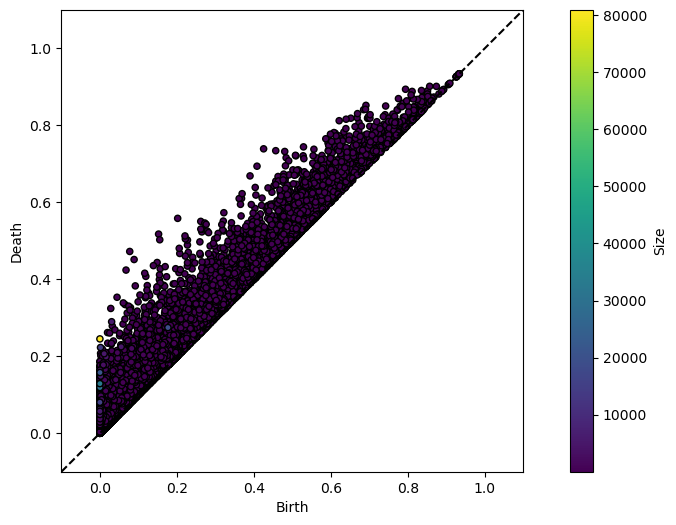

In [12]:
fig, ax = plt.subplots(1,1, figsize=(12,6))
plot_diagrams(PDa_sorted[PDa_sorted[:,2]>-1], color_by_value=True, cmap="viridis", size=20, title="", ax=ax, xy_range=[-0.1, 1.1, -0.1, 1.1], label_color_bar = "Size")
plt.savefig('image/pagoda_pd_0_sizes.pdf', bbox_inches='tight')

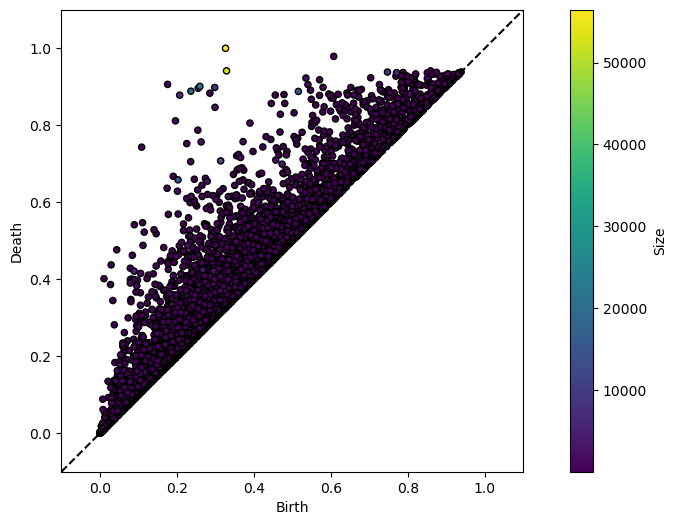

In [13]:
fig, ax = plt.subplots(1,1, figsize=(12,6))
plot_diagrams(PDb_sorted[PDb_sorted[:,2]>-1], color_by_value=True, cmap="viridis", size=20, title="", ax=ax, xy_range=[-0.1, 1.1, -0.1, 1.1], label_color_bar = "Size")
plt.savefig('image/pagoda_pd_1_sizes.pdf', bbox_inches='tight')

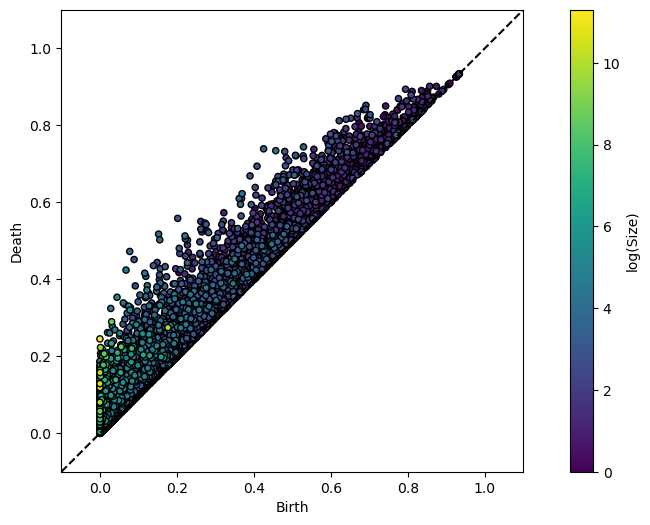

In [14]:
fig, ax = plt.subplots(1,1, figsize=(12,6))
plot_diagrams(PDa_sorted_log[PDa_sorted_log[:,2]>-1], color_by_value=True, cmap="viridis", size=20, title="", ax=ax, xy_range=[-0.1, 1.1, -0.1, 1.1], label_color_bar = "log(Size)")
plt.savefig('image/pagoda_pd_0_sizes_logscale.png', bbox_inches='tight', dpi=300)

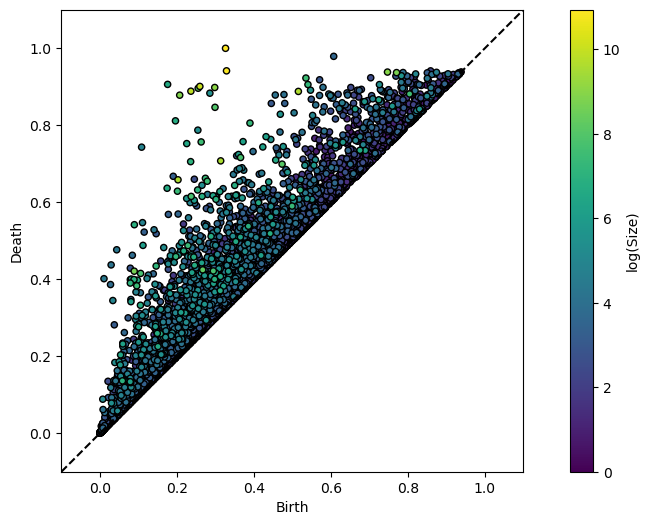

In [15]:
fig, ax = plt.subplots(1,1, figsize=(12,6))
plot_diagrams(PDb_sorted_log[PDb_sorted_log[:,2]>-1], color_by_value=True, cmap="viridis", size=20, title="", ax=ax, xy_range=[-0.1, 1.1, -0.1, 1.1], label_color_bar = "log(Size)")
plt.savefig('image/pagoda_pd_1_sizes_logscale.png', bbox_inches='tight', dpi=300)

In [16]:
PDa2 = PDa_sorted[PDa_sorted[:,2]<100]

In [17]:
# Checking correlation between persistence and size
pers = PDa_sorted[:,1] - PDa_sorted[:,0]
size = PDa_sorted[:,2]
correlation = np.corrcoef(pers, size)[0, 1]

In [18]:
# Checking correlation between persistence and size
pers = PDa2[:,1] - PDa2[:,0]
size = PDa2[:,2]
correlation = np.corrcoef(pers, size)[0, 1]

In [19]:
correlation

0.3924252322511926

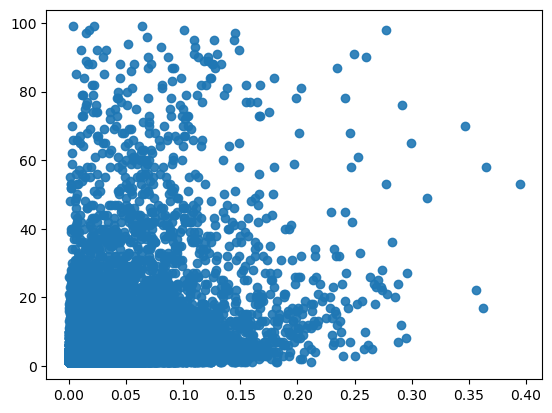

In [20]:
plt.scatter(pers, size, alpha=0.9)
# plt.yscale('log')
plt.savefig('image/pagoda_size_correlation.png', bbox_inches='tight', dpi=300)

In [21]:
correlation

0.3924252322511926

In [22]:
# Checking correlation between persistence and size
persb = PDb_sorted[:,1] - PDb_sorted[:,0]
sizeb = PDb_sorted[:,2]
correlationb = np.corrcoef(persb, sizeb)[0, 1]

In [23]:
correlationb

0.2693206559707378

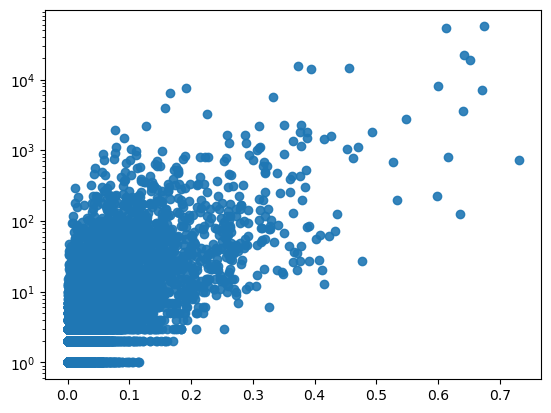

In [24]:
plt.scatter(persb, sizeb, alpha=0.9)
plt.yscale('log')
plt.savefig('image/pagoda_size_correlation_log-1.png', bbox_inches='tight', dpi=300)

In [25]:
def plot_sizer_aware_filter(surface, eta, epsilon, name_prefix, save=False, show=True, cmap="inferno"):
    """
    Plots the size-aware filtering of a surface using topological persistence.
    Args:
        surface (numpy.ndarray): The surface to be filtered.
        eta (int): The maximum size of features to be retained.
        epsilon (float): The threshold for filtering.
    """
    img_name = name_prefix + f"_size_filtered_{eta}_{str(epsilon).replace('.', '')}"
    tfi = ta.TopologicalFilterImage(surface)
    filterd_surface = tfi.low_pers_filter(epsilon=epsilon, size_range=[0, eta])
    tfi2 = ta.TopologicalFilterImage(filterd_surface, dual=True)
    filterd_surface = tfi2.low_pers_filter(epsilon=epsilon, size_range=[0, eta])

    pd0 = tfi.get_persistence()
    pd1 = tfi2.get_persistence()
    if pd0.size:
       sizes0 = np.log(tfi.get_persistence()[:, 4])
    else:
        sizes0 = np.array([])
    if pd1.size:
        sizes1 = np.log(tfi2.get_persistence()[:, 4])
    else:
        sizes1 = np.array([])
    if sizes0.size or sizes1.size:
        sizes = np.concatenate((sizes0, sizes1))
        vmin = np.min(sizes)
        vmax = np.max(sizes)
    else:
        vmin = None
        vmax = None


    tfi_H0 = ta.TopologicalFilterImage(filterd_surface)
    tfi_H1 = ta.TopologicalFilterImage(filterd_surface, dual=True)
    _ = tfi_H0.low_pers_filter(0)
    PD_H0 = tfi_H0.get_persistence()
    if PD_H0.size:
        PD_H0 = PD_H0[:,[0,1,4]]
        PD_H0 = PD_H0[PD_H0[:,2].argsort()]
        PD_H0[:,2] = np.log(PD_H0[:,2])
    else: # Workaround for empty persistence diagrams
        PD_H0 = np.array([[10000,10000,0]])
    _ = tfi_H1.low_pers_filter(0)
    PD_H1 = tfi_H1.get_persistence()
    if PD_H1.size:
        PD_H1 = PD_H1[:,[0,1,4]]
        PD_H1 = PD_H1[PD_H1[:,2].argsort()]
        PD_H1[:,2] = np.log(PD_H1[:,2])
    else:
        PD_H1 = np.array([[10000,10000,0]])

    fig, ax = plt.subplots(1, 3, figsize=(19, 4))
    ax[0].imshow(filterd_surface, cmap=cmap)
    ax[0].axis('off')
    if PD_H0.size:
        plot_diagrams(PD_H0, size=20, ax=ax[1], xy_range=[-0.1, 1.1, -0.1, 1.1], label_color_bar="Log(Size)", color_by_value=True, cmap="viridis", vmin=vmin, vmax=vmax)
    else:
        plot_diagrams(PD_H0, size=20, ax=ax[1], xy_range=[-0.1, 1.1, -0.1, 1.1])
    ax[1].plot([-100, 100], [-100 + epsilon, 100 + epsilon], '--', linewidth=1.0, c="r", label="threshold")
    ax[1].legend(loc="lower right")
    if PD_H1.size:
        plot_diagrams(PD_H1, size=20, ax=ax[2], xy_range=[-0.1, 1.1, -0.1, 1.1], label_color_bar="Log(Size)", color_by_value=True, cmap="viridis", vmin=vmin, vmax=vmax)
    else:
        plot_diagrams(PD_H1, size=20, ax=ax[2], xy_range=[-0.1, 1.1, -0.1, 1.1])
    ax[2].plot([-100, 100], [-100 + epsilon, 100 + epsilon], '--', linewidth=1.0, c="r", label="threshold")
    ax[2].legend(loc="lower right")
    if save:
        #create directory if it does not exist
        os.makedirs('image/size_filtered_'+name_prefix, exist_ok=True)
        plt.savefig(f'image/size_filtered_{name_prefix}/{img_name}.png', bbox_inches='tight', dpi=300)
    if show:
        plt.show()
    plt.close()

In [26]:
a = np.zeros((10,10))
# a = np.random.rand(10,10)
tfi_H0 = ta.TopologicalFilterImage(a)
_ = tfi_H0.low_pers_filter(0)
PD_H0 = tfi_H0.get_persistence()
if PD_H0.size:
    print("yes")


Filtering with eta=10, epsilon=0.1


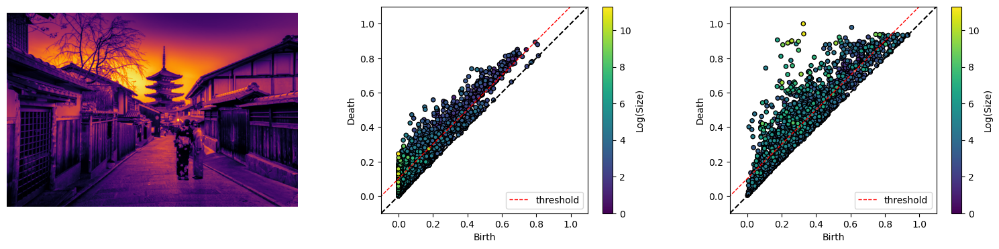

Filtering with eta=10, epsilon=0.2


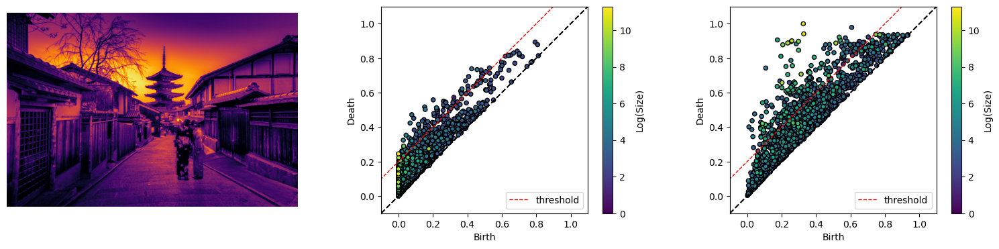

Filtering with eta=10, epsilon=0.3


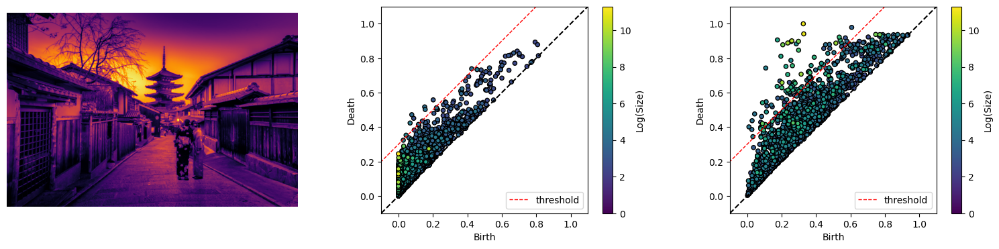

Filtering with eta=10, epsilon=0.4


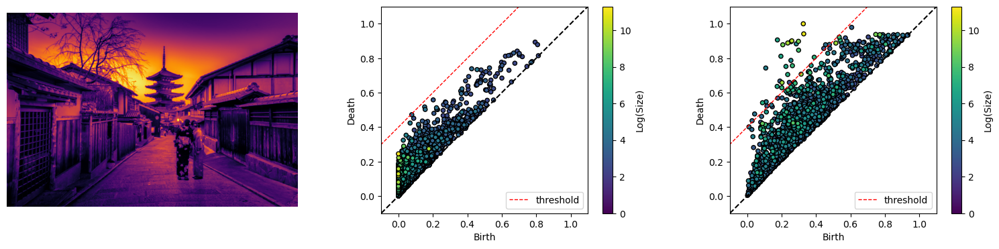

Filtering with eta=10, epsilon=0.5


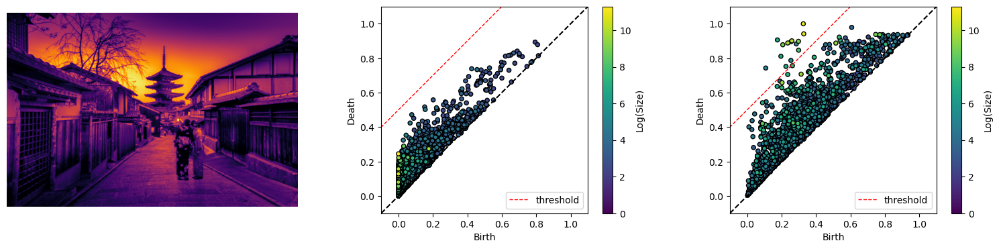

Filtering with eta=10, epsilon=0.6


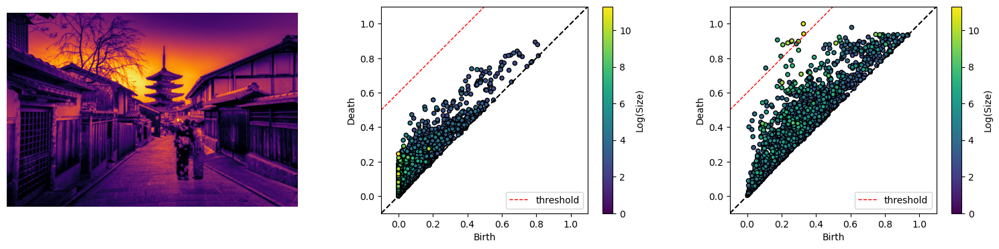

Filtering with eta=10, epsilon=0.7


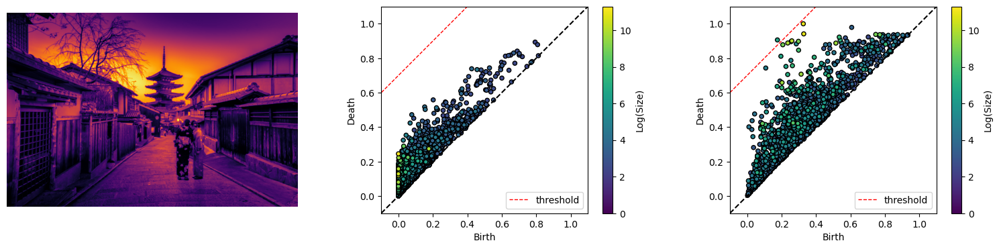

Filtering with eta=10, epsilon=0.8


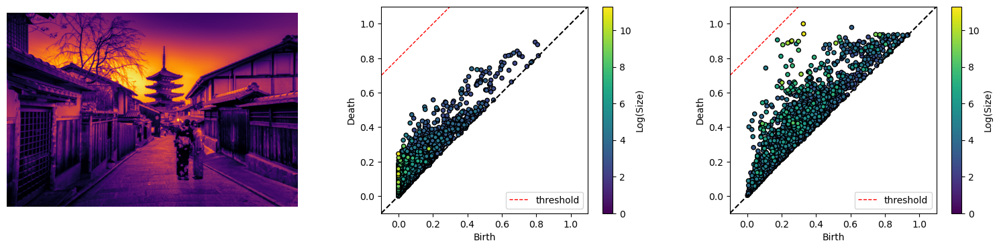

Filtering with eta=10, epsilon=0.9


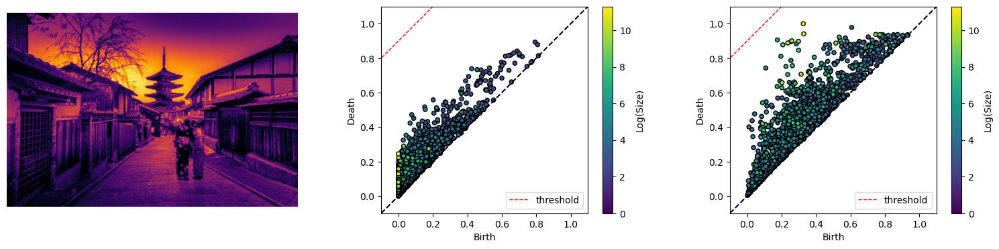

Filtering with eta=10, epsilon=2.0


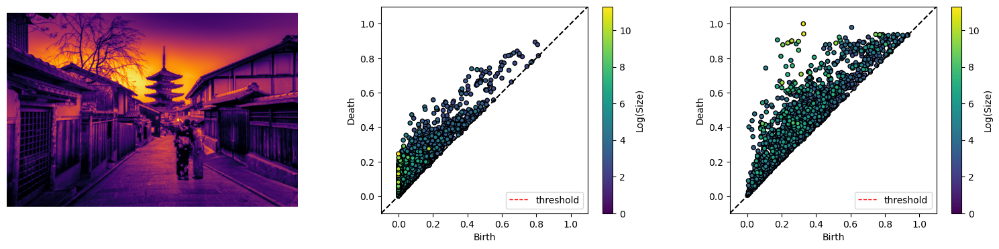

Filtering with eta=100, epsilon=0.1


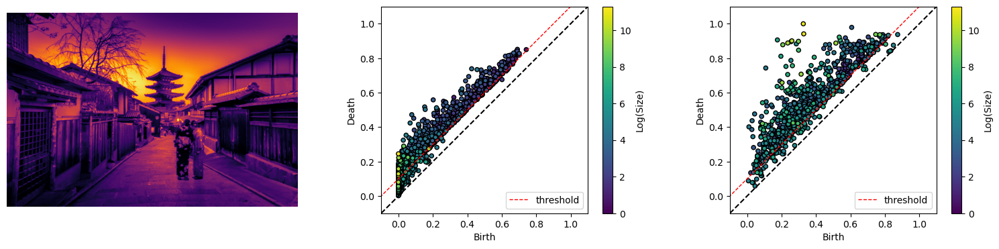

Filtering with eta=100, epsilon=0.2


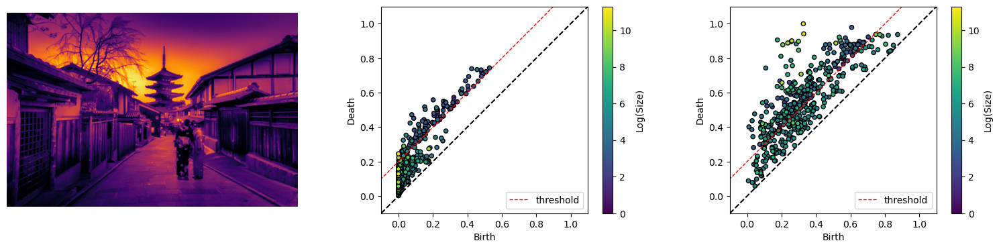

Filtering with eta=100, epsilon=0.3


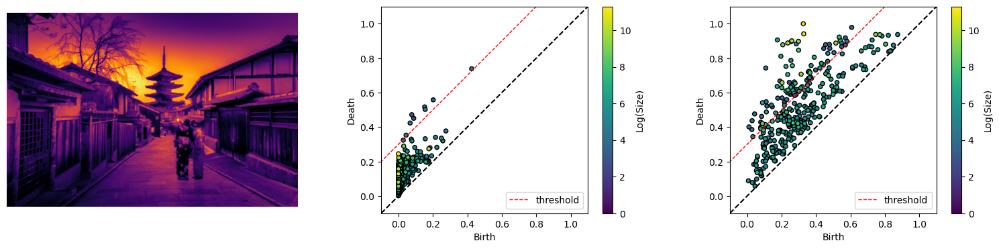

Filtering with eta=100, epsilon=0.4


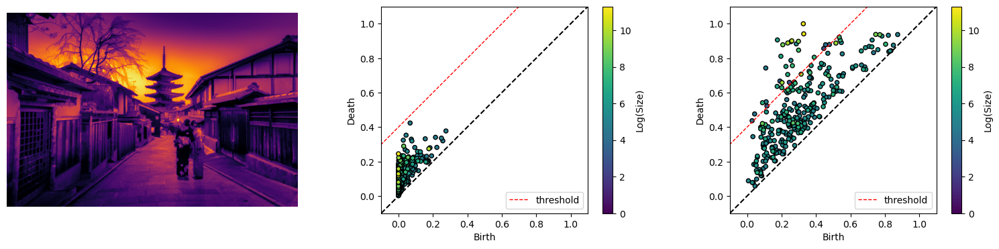

Filtering with eta=100, epsilon=0.5


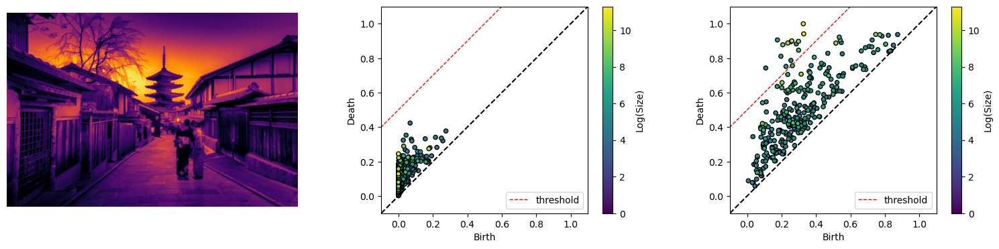

Filtering with eta=100, epsilon=0.6


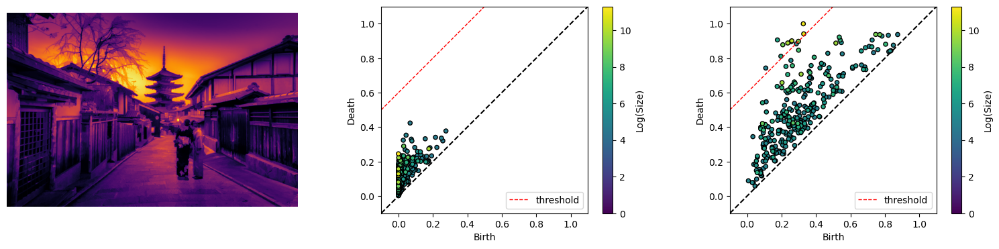

Filtering with eta=100, epsilon=0.7


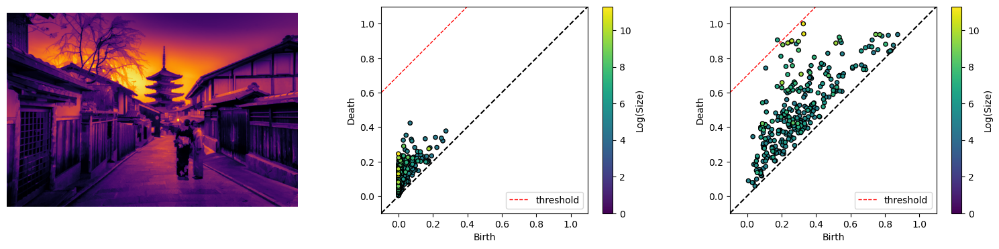

Filtering with eta=100, epsilon=0.8


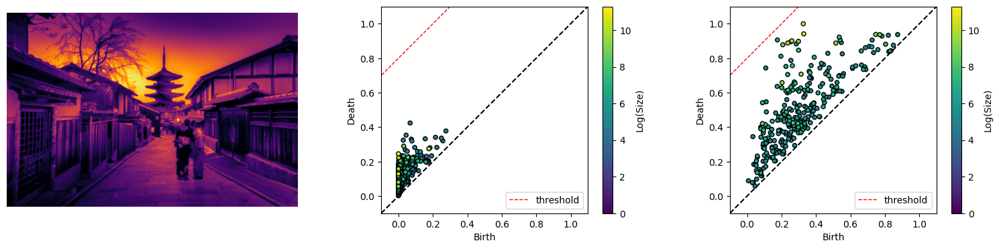

Filtering with eta=100, epsilon=0.9


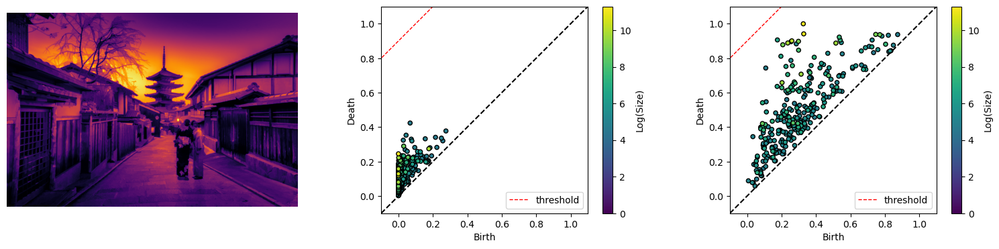

Filtering with eta=100, epsilon=2.0


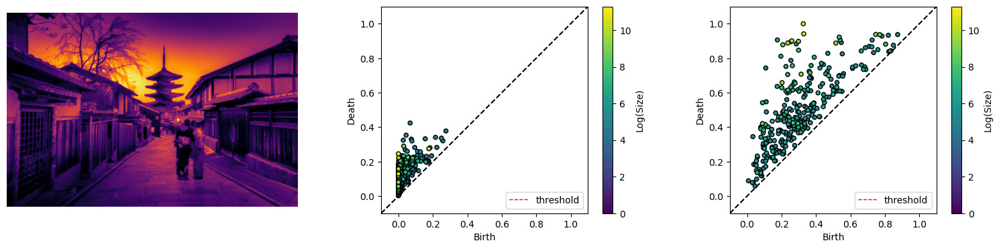

Filtering with eta=500, epsilon=0.1


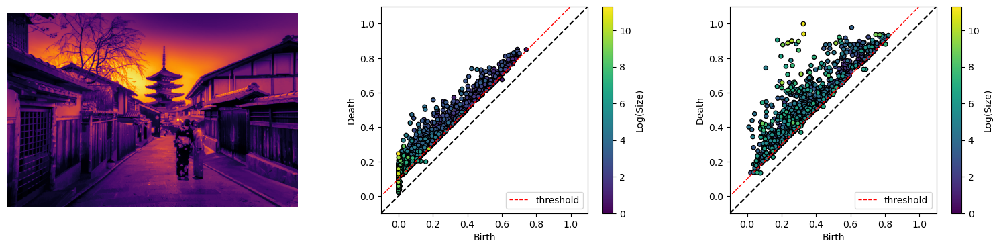

Filtering with eta=500, epsilon=0.2


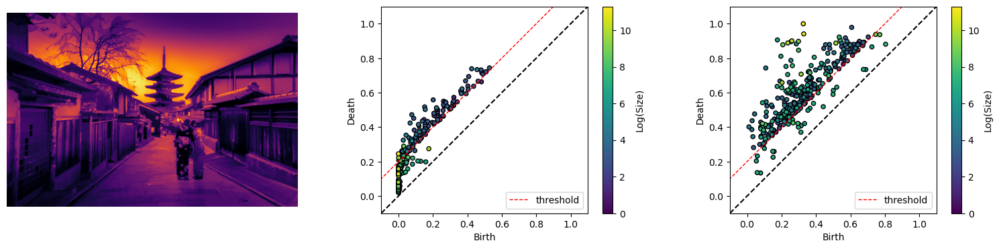

Filtering with eta=500, epsilon=0.3


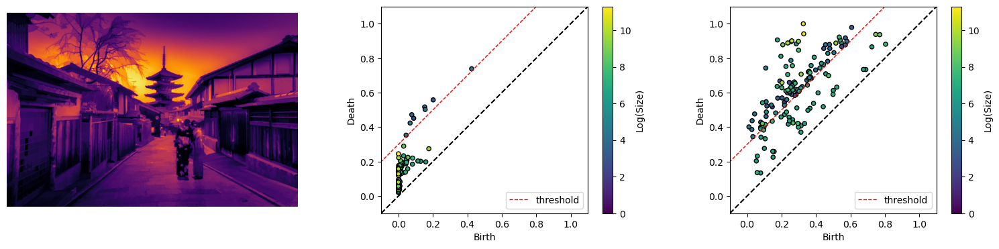

Filtering with eta=500, epsilon=0.4


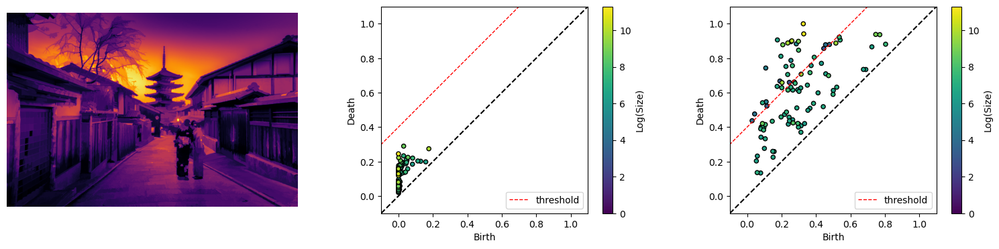

Filtering with eta=500, epsilon=0.5


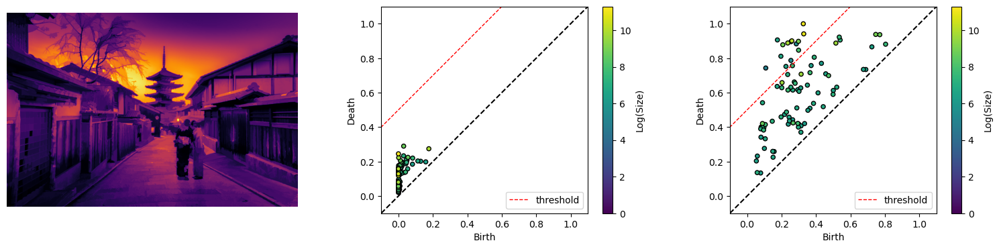

Filtering with eta=500, epsilon=0.6


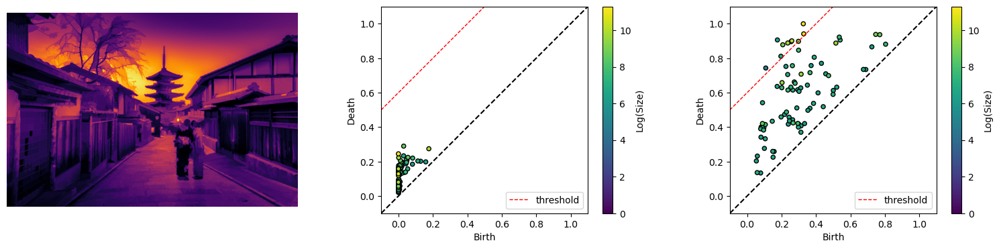

Filtering with eta=500, epsilon=0.7


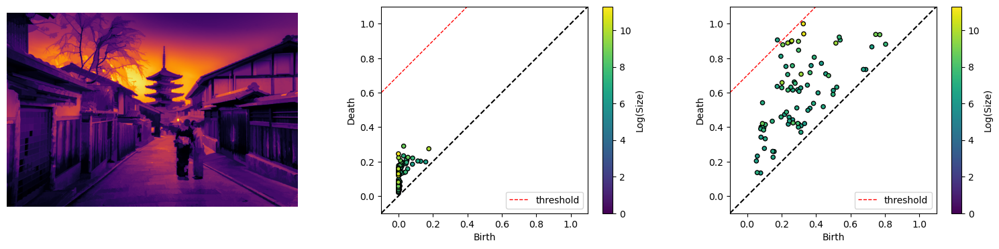

Filtering with eta=500, epsilon=0.8


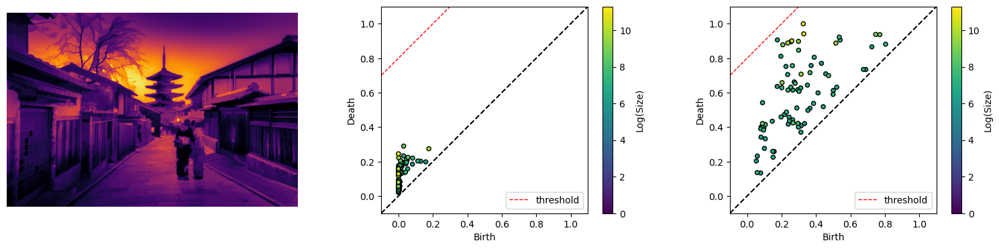

Filtering with eta=500, epsilon=0.9


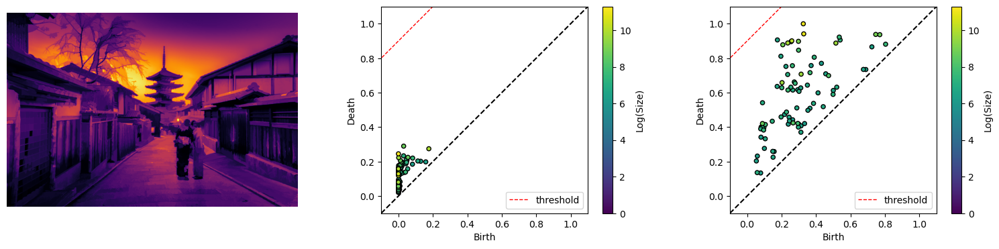

Filtering with eta=500, epsilon=2.0


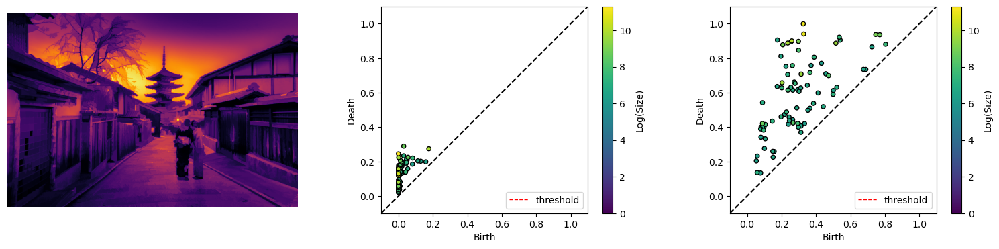

Filtering with eta=1000, epsilon=0.1


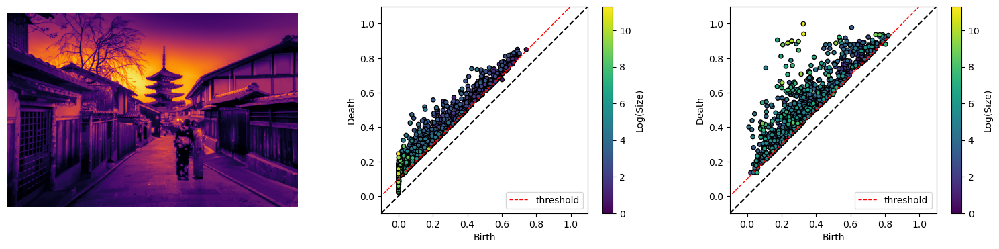

Filtering with eta=1000, epsilon=0.2


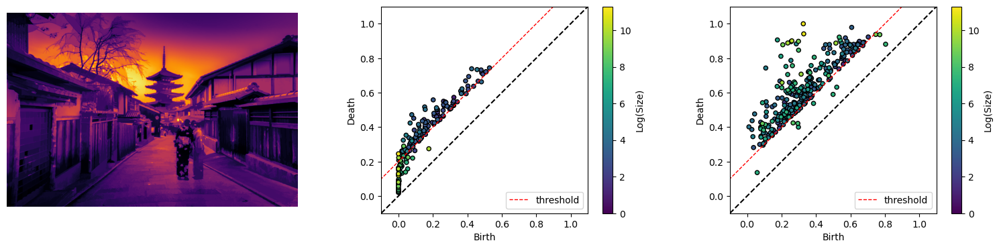

Filtering with eta=1000, epsilon=0.3


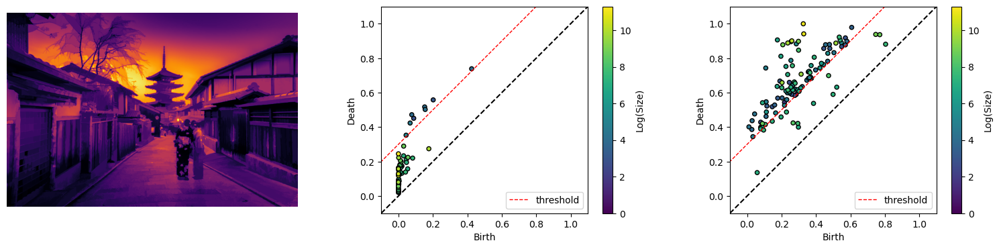

Filtering with eta=1000, epsilon=0.4


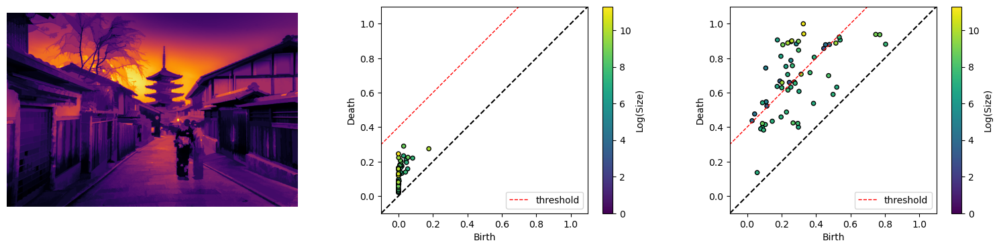

Filtering with eta=1000, epsilon=0.5


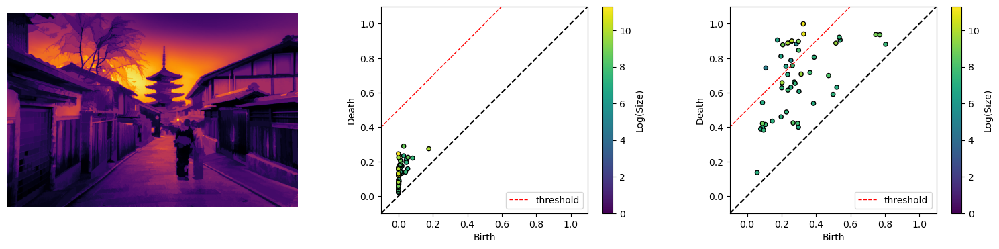

Filtering with eta=1000, epsilon=0.6


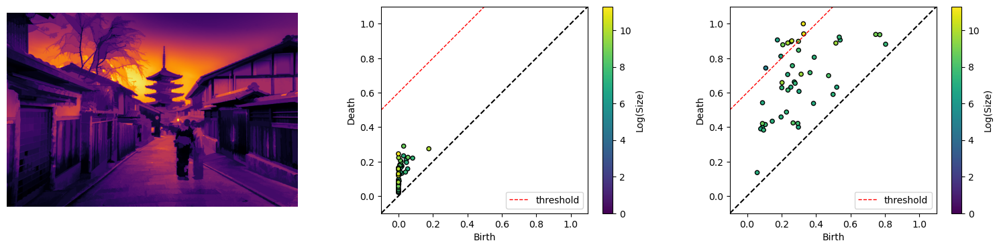

Filtering with eta=1000, epsilon=0.7


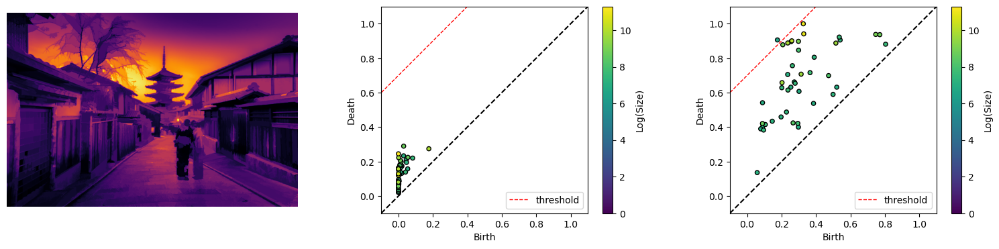

Filtering with eta=1000, epsilon=0.8


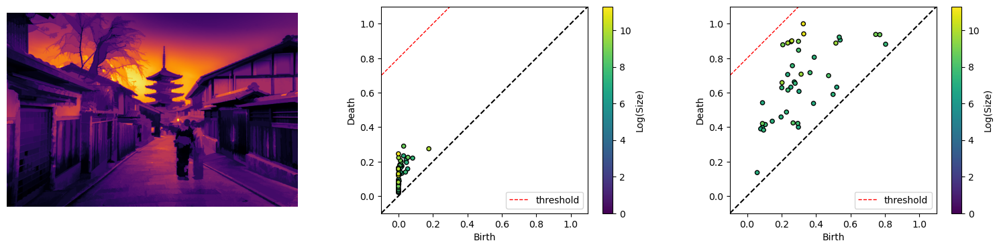

Filtering with eta=1000, epsilon=0.9


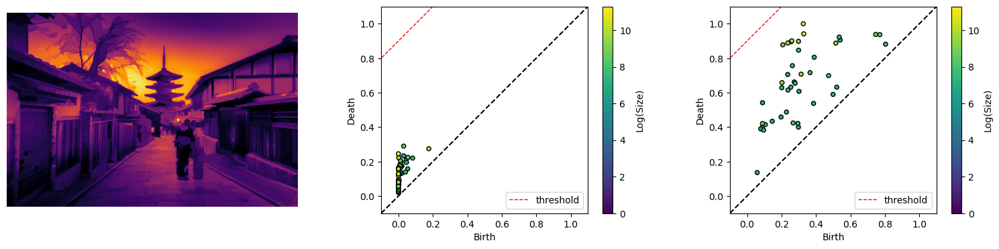

Filtering with eta=1000, epsilon=2.0


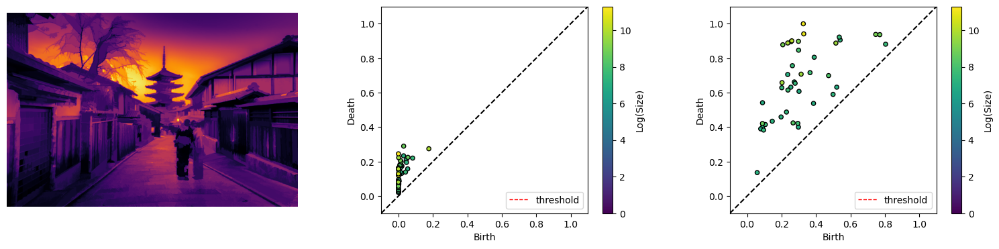

Filtering with eta=10000, epsilon=0.1


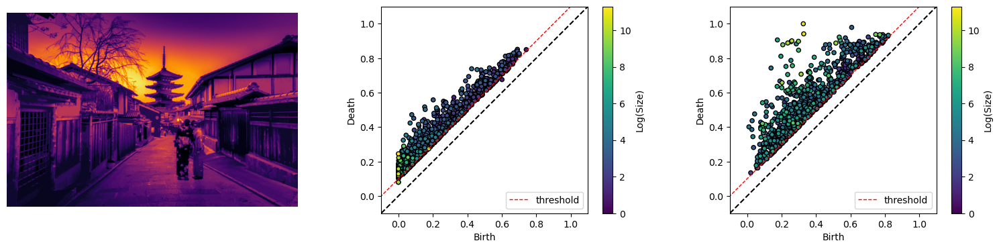

Filtering with eta=10000, epsilon=0.2


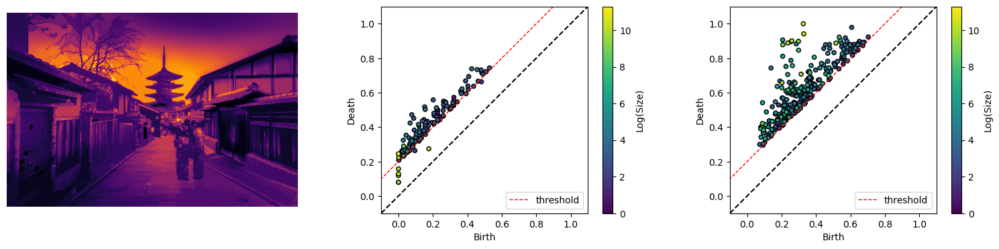

Filtering with eta=10000, epsilon=0.3


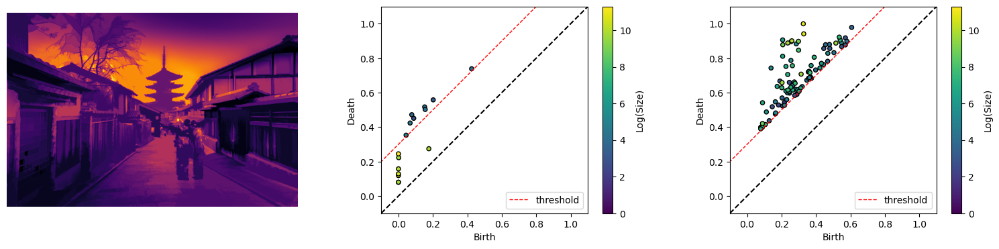

Filtering with eta=10000, epsilon=0.4


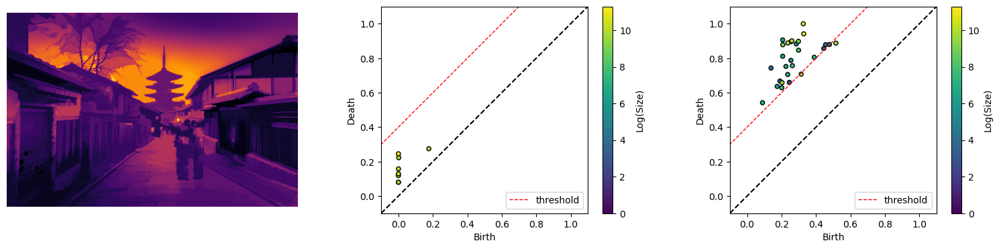

Filtering with eta=10000, epsilon=0.5


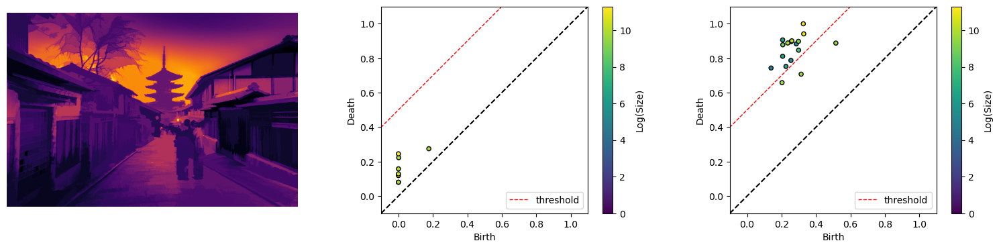

Filtering with eta=10000, epsilon=0.6


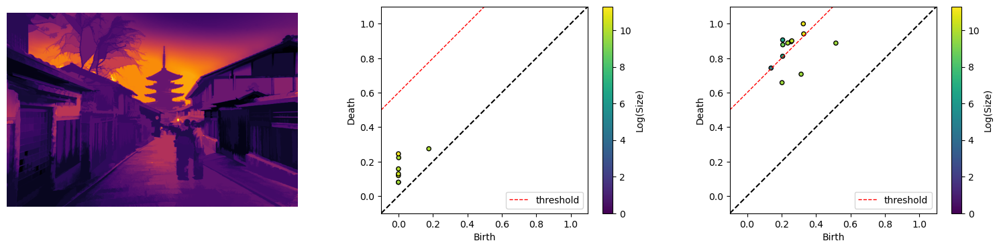

Filtering with eta=10000, epsilon=0.7


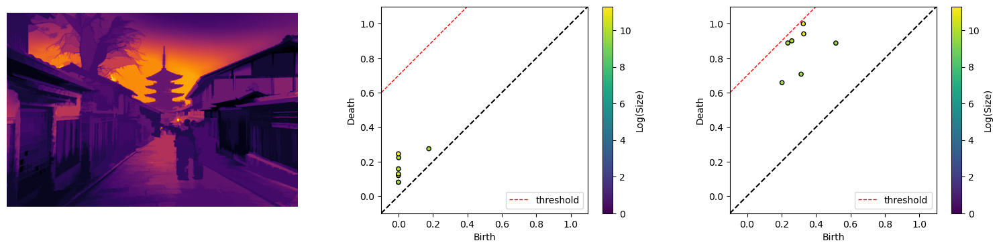

Filtering with eta=10000, epsilon=0.8


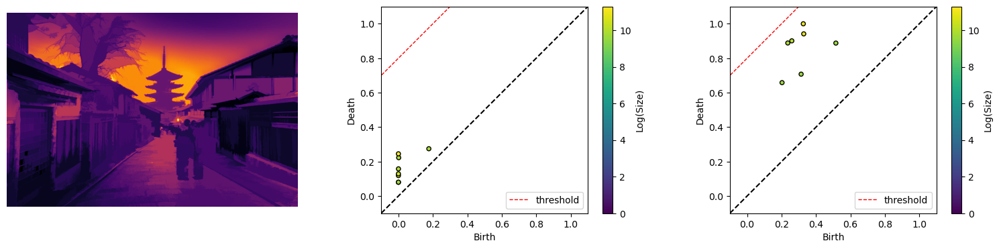

Filtering with eta=10000, epsilon=0.9


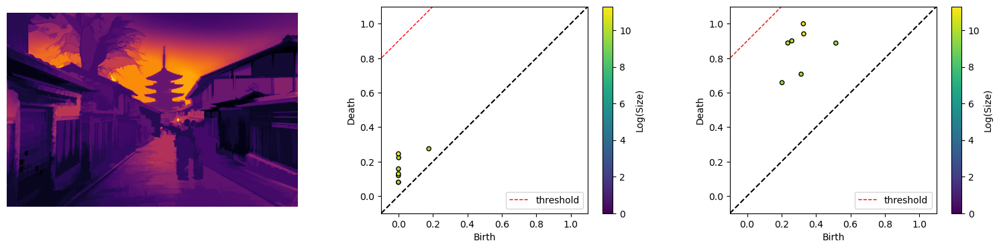

Filtering with eta=10000, epsilon=2.0


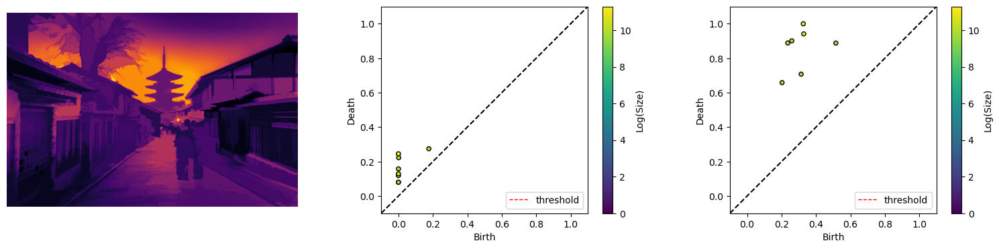

In [27]:
etas = [10,100,500,1000,10000]
epsilons = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 2.0]
for eta in etas:
    for epsilon in epsilons:
        print(f"Filtering with eta={eta}, epsilon={epsilon}")
        plot_sizer_aware_filter(surface, eta=eta, epsilon=epsilon, name_prefix="pagoda", save=True)

## Synthetic example

In [28]:
# Defining the scalar field to be used in the example
def scalar_field2(x,y):
    np.random.seed(42)
    MM = [30, 30, 20, 300, 300]
    M = sum(MM)
    bb = [0.1, 1, 10, 100, 1000]
    a = np.random.rand(M,2)*10
    b = np.array([])
    c = np.random.rand(M)*0.3 + 0.1
    for i in range(len(MM)):
        b = np.concatenate((b, (1+np.random.rand(MM[i]))*bb[i] + 0.1))
    m = c.size
    result = 0
    for i in range(m):
        result += 1 / (b[i]*(x - a[i][0])**2 + b[i]*(y - a[i][1])**2 + c[i])

    a = np.random.rand(M,2)*10
    b = np.array([])
    c = np.random.rand(M)*0.3 + 0.1
    for i in range(len(MM)):
        b = np.concatenate((b, (1+np.random.rand(MM[i]))*bb[i] + 0.1))
    m = c.size
    result2 = 0
    for i in range(m):
        result2 += 1 / (b[i]*(x - a[i][0])**2 + b[i]*(y - a[i][1])**2 + c[i])

    Z = result - result2
    # Z2 = (x-5)**2 + 3*(y-5)**2
    # Z = Z + Z2

    return Z

x = np.linspace(0, 10, 500)
y = np.linspace(0, 10, 500)
X, Y = np.meshgrid(x, y)
surface = scalar_field2(X, Y)

#normalizing the surface
surface = (surface - np.min(surface)) / (np.max(surface) - np.min(surface))

In [29]:
def size_aware_filter(surface, eta, epsilon):
    """
    Applies size-aware filtering to a surface using topological persistence.
    Args:
        surface (numpy.ndarray): The surface to be filtered.
        eta (int): The maximum size of features to be retained.
        epsilon (float): The threshold for filtering.
    """
    tfi = ta.TopologicalFilterImage(surface)
    filterd_surface = tfi.low_pers_filter(epsilon=epsilon, size_range=[0, eta])
    tfi2 = ta.TopologicalFilterImage(filterd_surface, dual=True)
    filterd_surface = tfi2.low_pers_filter(epsilon=epsilon, size_range=[0, eta])

    return filterd_surface

## Second synthetic example

In [30]:
import numpy as np

def push_region(surface, center, radius, min_value, max_value):
    """
    Modifies a circular region of the surface by degrading toward the center.
    The value is minimum at the center and increases radially to max_value.

    Args:
        surface (numpy.ndarray): The surface to be modified.
        center (tuple): The center of the region (x, y).
        radius (float): The radius of the region.
        min_value (float): The value at the center.
        max_value (float): The value at the boundary of the region.
    """
    x, y = np.indices(surface.shape)
    dx = x - center[0]
    dy = y - center[1]
    dist = np.sqrt(dx**2 + dy**2)

    # Create a mask for points within the radius
    mask = dist < radius

    # Normalize distance: 0 at center, 1 at radius
    norm_dist = dist[mask] / radius

    # Interpolate from min_value to max_value based on distance
    degraded_values = min_value + (max_value - min_value) * norm_dist

    # Apply the degraded values to the surface
    surface[mask] += degraded_values


max: 1.0, min: 0.0


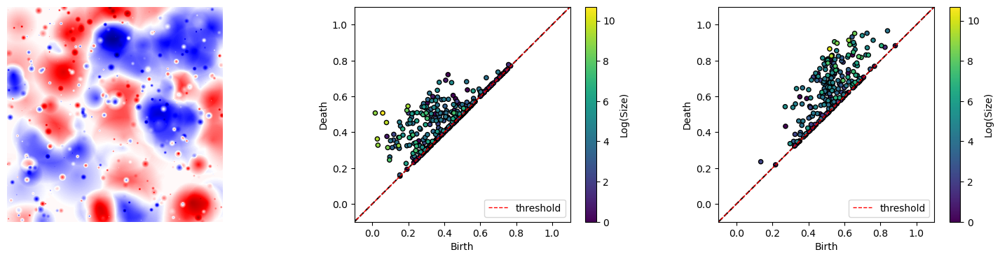

In [31]:
# 0-homology classes
# push_region(surface, center=(50, 50), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(50, 150), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(50, 250), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(50, 350), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(50, 450), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(150, 50), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(150, 150), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(150, 250), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(150, 350), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(150, 450), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(250, 50), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(250, 150), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(250, 250), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(250, 350), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(250, 450), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(350, 50), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(350, 150), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(350, 250), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(350, 350), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(350, 450), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(450, 50), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(450, 150), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(450, 250), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(450, 350), radius=40, min_value=-0.5, max_value=0.0)
# push_region(surface, center=(450, 450), radius=40, min_value=-0.5, max_value=0.0)


# # 1-homology classes
# push_region(surface, center=(200, 200), radius=40, min_value=0.5, max_value=0.0)

N = 90
d = 500
np.random.seed(42)  # For reproducibility
surface = np.zeros((d,d))
centers = np.random.randint(0, d, size=(N, 2))
radii = np.random.randint(20, 80, size=N)
min_values = np.random.uniform(-1.0, 1.0, size=N)
max_value = 0.0
for center, radius, min_value in zip(centers, radii, min_values):
    push_region(surface, center=center, radius=radius, min_value=min_value, max_value=max_value)


N = 400
centers = np.random.randint(0, d, size=(N, 2))
radii = np.random.randint(0.5, 10, size=N)
min_values = np.random.uniform(-1.0, 1.0, size=N)
max_value = 0.0
for center, radius, min_value in zip(centers, radii, min_values):
    push_region(surface, center=center, radius=radius, min_value=min_value, max_value=max_value)

# normalizing the surface
surface = (surface - np.min(surface)) / (np.max(surface) - np.min(surface))


eta = 0
epsilon = 0
print(f"max: {np.max(surface)}, min: {np.min(surface)}")
plot_sizer_aware_filter(surface, eta=eta, epsilon=epsilon, name_prefix="degrade", cmap="seismic")

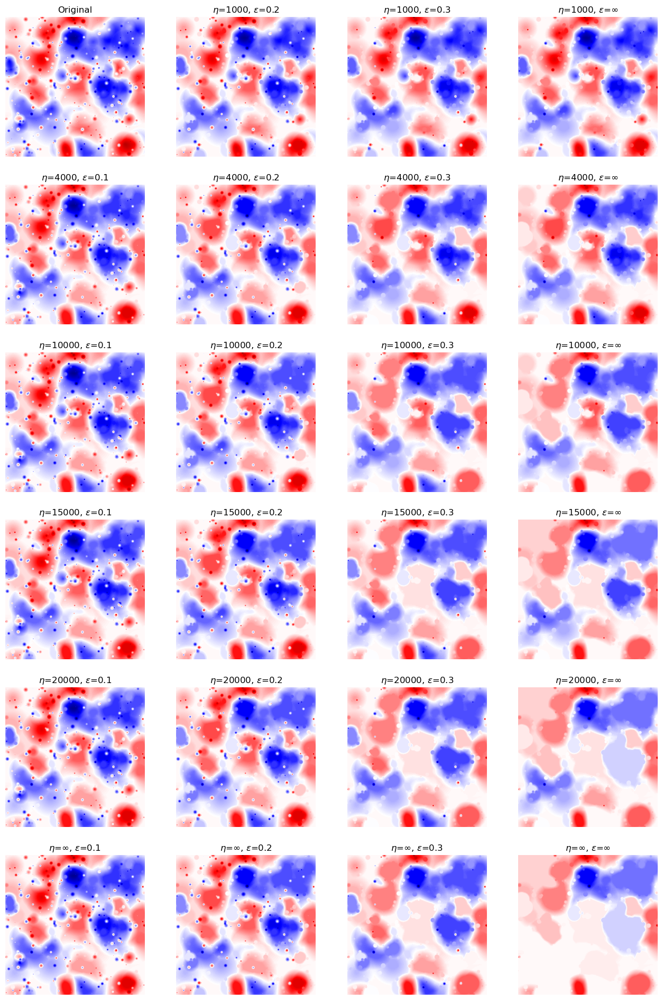

In [32]:
cmap = "seismic"
fig, ax = plt.subplots(6, 4, figsize=(16, 24))
etas = [1000, 4000, 10000, 15000, 20000, 100000]
epsilons = [0.1, 0.2, 0.3, 0.5]
v_min = np.min(surface)
v_max = np.max(surface)
for i, eta in enumerate(etas):
    for j, epsilon in enumerate(epsilons):
        filtered_surface = size_aware_filter(surface, eta=eta, epsilon=epsilon)
        if epsilon == 0.5:
            epsilon = '$\infty$'
        eta_label = '$\infty$' if eta == 100000 else eta
        ax[i, j].imshow(filtered_surface, cmap=cmap, vmin=v_min, vmax=v_max)
        ax[i, j].axis('off')
        ax[i, j].set_title(f"$\eta$={eta_label}, $\\varepsilon$={epsilon}")
ax[0,0].imshow(surface, cmap=cmap, vmin=v_min, vmax=v_max)
ax[0,0].axis('off')
ax[0,0].set_title("Original")

plt.savefig('image/degrade_size_aware_filtering_grid.pdf', bbox_inches='tight')

In [33]:
etas = [1000]
epsilons = [0.0, 0.1, 0.2, 0.3, 0.5]
for eta in etas:
    print(f"Filtering with eta={eta}")
    for epsilon in epsilons:
        plot_sizer_aware_filter(surface, eta=eta, epsilon=epsilon, name_prefix="degrade", save=True, show=False, cmap="seismic")

Filtering with eta=1000
